In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

import anndata as ad
import scanpy as sc

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from umap import UMAP
from scipy.stats import gmean
import time

from scroutines import powerplots
import importlib
importlib.reload(powerplots)
from scroutines import basicu
from scroutines.miscu import is_in_polygon

import utils_merfish




In [2]:
np.random.seed(0)

In [3]:
def geometric_mean(vals, clip=1e-10):
    """
    vals needs to be positive...
    """
    return np.exp(np.nanmean(np.log(np.clip(vals, clip, None))))

def binning_pipe(adata, n=20, layer='lnorm', bin_type='depth_bin'):
    """
    """
    assert bin_type in ['depth_bin', 'width_bin']
    # bin it 
    depth_bins, depth_binned = utils_merfish.binning(adata.obs['depth'].values, n)
    width_bins, width_binned = utils_merfish.binning(adata.obs['width'].values, n)

    norm_ = pd.DataFrame(adata.layers[layer], columns=adata.var.index)
    norm_['depth_bin'] = depth_binned
    norm_['width_bin'] = width_binned
    
    norm_mean = norm_.groupby(bin_type).mean(numeric_only=True)
    norm_sem  = norm_.groupby(bin_type).sem(numeric_only=True)
    norm_std  = norm_.groupby(bin_type).std(numeric_only=True)
    norm_n    = norm_[bin_type].value_counts(sort=False)

    return norm_mean, norm_sem, norm_std, norm_n, depth_binned, width_binned, depth_bins, width_bins



# load data and annotation

In [4]:
# ABC genes
f = '/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/results/MERFISH_gene_panel_Version1_March9.csv'
df1 = pd.read_csv(f)
f = '/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/results/gene_ptime_P28_L23_Mar27.tsv'
df2 = pd.read_csv(f).sort_values('gene_ptime')
df = pd.merge(df1, df2, left_on='gene_name_data', right_on='gene').sort_values('gene_ptime')

genes_abco = df['gene_name_vizgen'].values
agenes = df[df['P17on_x']=='A']['gene_name_vizgen'].values
bgenes = df[df['P17on_x']=='B']['gene_name_vizgen'].values
cgenes = df[df['P17on_x']=='C']['gene_name_vizgen'].values
genes_abco.shape, len(agenes), agenes, len(bgenes), bgenes, len(cgenes), cgenes

((170,),
 64,
 array(['Met', '6530403H02Rik', 'Rhbdl3', 'Adamts2', 'Cdh13', 'Col23a1',
        'Vwc2l', 'Syt10', 'Kcnn3', 'Arhgef28', 'Pcdh19', 'Pakap', 'Ikzf2',
        'Nckap5', 'Dpyd', 'Gpc5', 'Slc6a7', 'Igsf11', 'Glis3', 'Ttc28',
        'Tenm1', 'Syt17', 'Robo1', 'Sema6a', 'Otof', 'Eda', 'Plxna1',
        'Tox3', 'Itga8', 'Kcnk13', 'Wnt4', 'Sdk2', 'Pdzrn4', 'Plxnd1',
        'Ryr3', 'Necab1', 'Camk2d', 'Iqgap2', 'Pdgfc', 'Gabrg3', 'Dscaml1',
        'Reln', 'Npas3', 'Cntn5', 'Rfx3', 'Grm1', 'Kirrel3', 'Nfib',
        'Fkbp5', 'Zfp608', 'Meis2', 'Mdga1', 'Tiam1', 'Grb14', 'Nkain3',
        'Epha6', 'Cacna1h', 'Pde1a', 'Nr3c2', 'Matn2', 'Tmem150c',
        'Adamts17', 'Ldb2', 'Egfem1'], dtype=object),
 35,
 array(['Grm8', 'Galnt17', 'Epha3', 'Rgs8', 'Sox5', 'Zfp804b', 'Tmeff1',
        'Fstl5', 'Cdh4', 'Kcnip3', 'Myh9', 'Sh3pxd2b', 'Klhl1', 'Trpc6',
        'Sema4a', 'Tafa1', 'Sertm1', 'Nrp1', 'Col26a1', 'Mas1', 'Igfn1',
        'Npas4', 'Scg3', 'Nptx2', 'Bdnf', 'Phf21b', 'Nell1', '

In [5]:
iegs = [
    'Fos',
    'Fosl2',
    'Nr4a1',
    'Egr1',
    'Nr4a2',
    'Nr4a3',
    'Crem',
    'Egr4',
    'Fosb',
    'Egr2',
    'Per1',
    'Junb',
    'Cebpb',
    'Klf4',
    'Atf3',
    'Klf2',
    'Maff',
    'Klf10',
    'Jund',
    'Mafk',
    'Srf',
    'Arc',
]

up_agenes = [
          'Vwc2l',
          'Tmem117', 
          'Kcnk13', 
          'Airn',
          'Ttc28', 
          'Col23a1',
          'Cdh13', 
          'Glis3', 
          'Iqgap2',
          'Nckap5',
          'Cpne6',
          '1700086L19Rik',
          'Otof',
          'Pcdh19',
          'Sema6a',
          'Gm42722',
          'Gabrg3',
          'Grm8', 
          'Palm2', 
          'Syt17',
         ]
up_agenes = np.intersect1d(up_agenes, genes_abco)

easifish_genes = [
    'Slc17a7', 'Gria3', 'Rorb', 'Kcnq5',
    
    'Adamts2', 'Sorcs3', 'Chrm2', 
    'Rfx3', 
    'Cdh13', 'Cdh12', 
    'Epha10',
    'Trpc6',
     
     
    'Kcnip3',  'Cntn5',
    'Cntnap2', 'Gabrg3',
    'Kcnh5',  'Grm8', 
    'Ncam2',  'Baz1a',
]


len(iegs), len(up_agenes), up_agenes, len(easifish_genes), easifish_genes

(22,
 14,
 array(['Cdh13', 'Col23a1', 'Gabrg3', 'Glis3', 'Grm8', 'Iqgap2', 'Kcnk13',
        'Nckap5', 'Otof', 'Pcdh19', 'Sema6a', 'Syt17', 'Ttc28', 'Vwc2l'],
       dtype=object),
 20,
 ['Slc17a7',
  'Gria3',
  'Rorb',
  'Kcnq5',
  'Adamts2',
  'Sorcs3',
  'Chrm2',
  'Rfx3',
  'Cdh13',
  'Cdh12',
  'Epha10',
  'Trpc6',
  'Kcnip3',
  'Cntn5',
  'Cntnap2',
  'Gabrg3',
  'Kcnh5',
  'Grm8',
  'Ncam2',
  'Baz1a'])

In [6]:
from merfish_datasets import merfish_datasets
from utils_merfish import rot2d
import json

directories = merfish_datasets
print(merfish_datasets)

{'P14NRa_ant': 'merfish_06142023/ant/region0', 'P28NRa_ant': 'merfish_06142023/ant/region1', 'P14NRa_pos': 'merfish_06142023/pos/region0', 'P28NRa_pos': 'merfish_06142023/pos/region1', 'P21NRa_ant': 'merfish_20231114/region0', 'P21DRa_ant': 'merfish_20231114/region2', 'P28DRa_ant': 'merfish_20231114/region1', 'P21NRa_pos': 'merfish_20231120/region0', 'P21DRa_pos': 'merfish_20231120/region1', 'P28DRa_pos': 'merfish_20231120/region2', 'P14NRb_ant': 'merfish_202404051211/region_0', 'P28NRb_ant': 'merfish_202404051211/region_1', 'P14NRb_pos': 'merfish_202404051214/region_0', 'P28NRb_pos': 'merfish_202404051214/region_1', 'P21NRb_ant': 'merfish_202404091526/region_2', 'P21DRb_ant': 'merfish_202404091526/region_1', 'P28DRb_ant': 'merfish_202404091526/region_0', 'P21NRb_pos': 'merfish_202404091601/region_0', 'P21DRb_pos': 'merfish_202404091601/region_2', 'P28DRb_pos': 'merfish_202404091601/region_1', 'P14NR_ant': 'merfish_06142023/ant/region0', 'P28NR_ant': 'merfish_06142023/ant/region1', 'P1

In [7]:
# load data
names = ['P28NR_pos', 'P28NR_ant', 'P28DR_ant',]
dfs = {}
adatas = {}
for name in names:
    dirc = directories[name]
    f_spot = f'/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/{dirc}/detected_transcripts_v1l23.csv'
    f_main = f'/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/organized/{name}_ctxglut_240411.h5ad'
    df = pd.read_csv(f_spot) # , nrows=1000)
    adata = ad.read_h5ad(f_main)
    
    dfs[name] = df
    adatas[name] = adata
    print(name, len(df), len(adata))

P28NR_pos 2194701 25253
P28NR_ant 1050088 20466
P28DR_ant 2172472 10678


# basic normalization and viz

In [8]:
# get size
area_factors = {}
for i, name in enumerate(names):
    adata = adatas[name]
    bound_l, bound_r, bound_d = adata.uns['bound_lrd']
    area = np.abs(bound_r - bound_l)*bound_d
    if i == 0:
        area0 = area
        
    area_factors[name] = area/area0
    print(name, bound_l, bound_r, bound_d, area/area0)

P28NR_pos 1400 3400 400 1.0
P28NR_ant 3000 4200 400 0.6
P28DR_ant 2500 4600 400 1.05


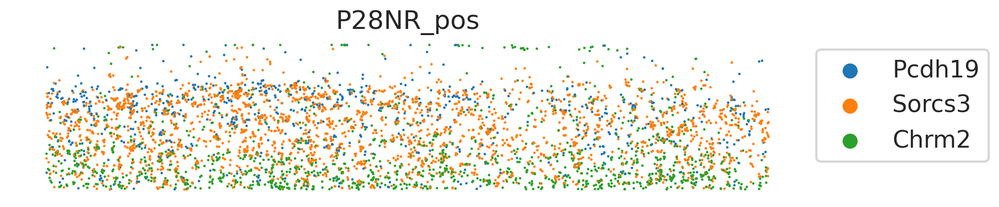

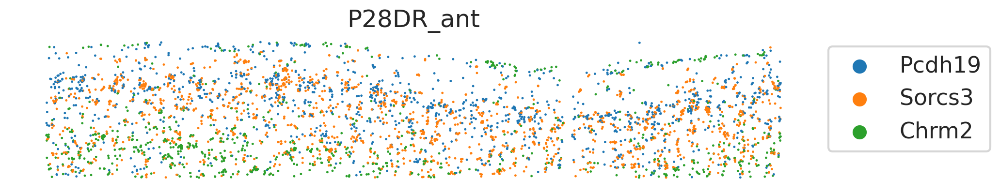

In [9]:
# plot some gene
# query_genes = ['Cdh13', 'Sox5', 'Npas4', 'Sorcs3', 'Grm8', 'Chrm2']
query_genes = ['Pcdh19', 'Sorcs3', 'Chrm2']
for name in ['P28NR_pos', 'P28DR_ant']: #, df in dfs.items():
    df = dfs[name]
    abc = df[df['gene'].isin(query_genes)]
    
    fig, ax = plt.subplots(1,1,figsize=(15,2))
    sns.scatterplot(data=abc.sample(frac=1, replace=False), 
                    x='width', y='depth', hue='gene', hue_order=query_genes, 
                    s=3, edgecolor='none', ax=ax, )
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title(name)
    ax.legend(bbox_to_anchor=(1,1))
    ax.invert_yaxis()
    plt.show()

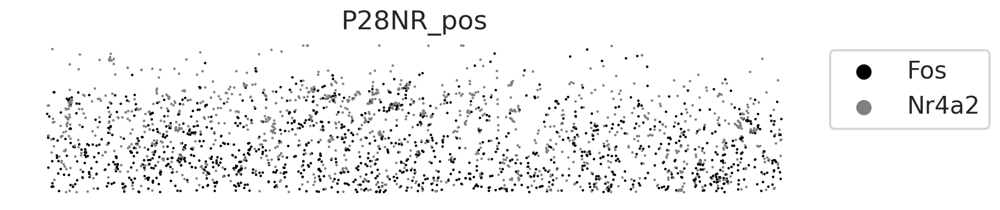

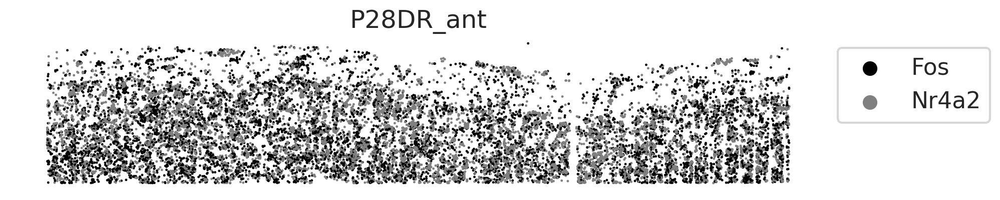

In [10]:
query_genes = ['Fos', 'Nr4a2',]# 'Nr4a3'] # 'Junb']
palette = {
    'Fos': 'k',
    'Nr4a2': 'gray',
}
for name in ['P28NR_pos', 'P28DR_ant']: #, df in dfs.items():
    df = dfs[name]
    abc = df[df['gene'].isin(query_genes)]
    
    fig, ax = plt.subplots(1,1,figsize=(15,2))
    sns.scatterplot(data=abc.sample(frac=1, replace=False), 
                    x='width', y='depth', hue='gene', hue_order=query_genes, 
                    palette=palette,
                    s=3, edgecolor='none', ax=ax, )
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title(name)
    ax.legend(bbox_to_anchor=(1,1))
    ax.invert_yaxis()
    plt.show()

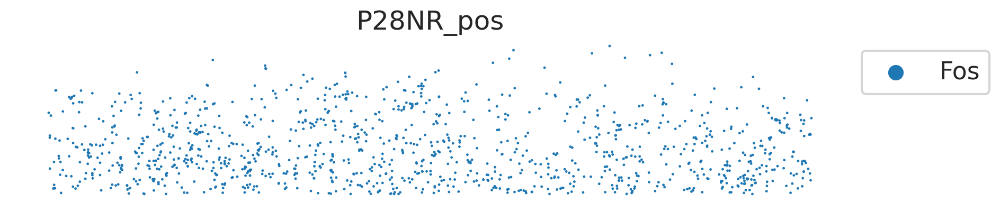

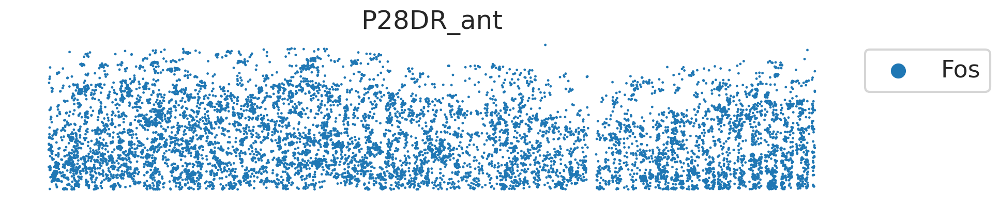

In [11]:
query_genes = ['Fos']
color = 'C3'
for name in ['P28NR_pos', 'P28DR_ant']: #, df in dfs.items():
    df = dfs[name]
    abc = df[df['gene'].isin(query_genes)]
    
    fig, ax = plt.subplots(1,1,figsize=(15,2))
    sns.scatterplot(data=abc.sample(frac=1, replace=False), 
                    x='width', y='depth', hue='gene', hue_order=query_genes, 
                    s=3, edgecolor='none', ax=ax, )
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title(name)
    ax.legend(bbox_to_anchor=(1,1))
    ax.invert_yaxis()
    plt.show()

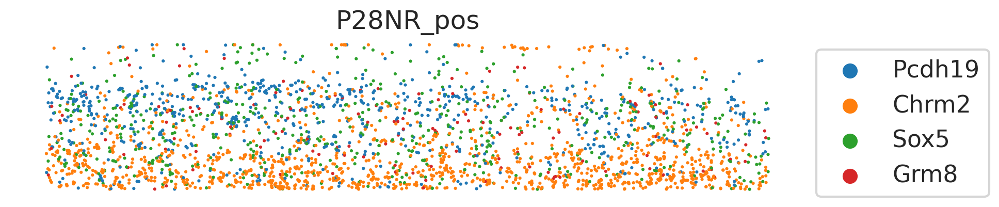

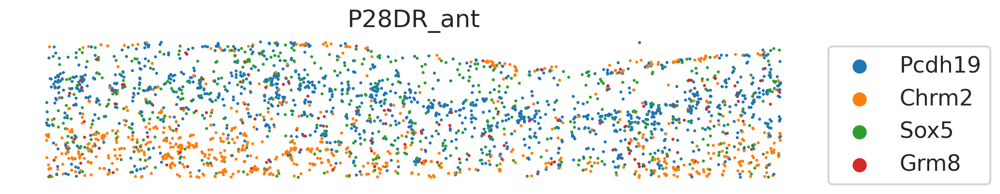

In [12]:
query_genes = ['Pcdh19', 'Chrm2', 'Sox5', 'Grm8',]
for name in ['P28NR_pos', 'P28DR_ant']: #, df in dfs.items():
    df = dfs[name]
    abc = df[df['gene'].isin(query_genes)]
    
    fig, ax = plt.subplots(1,1,figsize=(15,2))
    sns.scatterplot(data=abc.sample(frac=1, replace=False), 
                    x='width', y='depth', hue='gene', hue_order=query_genes, 
                    s=5, edgecolor='none', ax=ax, )
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title(name)
    ax.legend(bbox_to_anchor=(1,1))
    ax.invert_yaxis()
    plt.show()

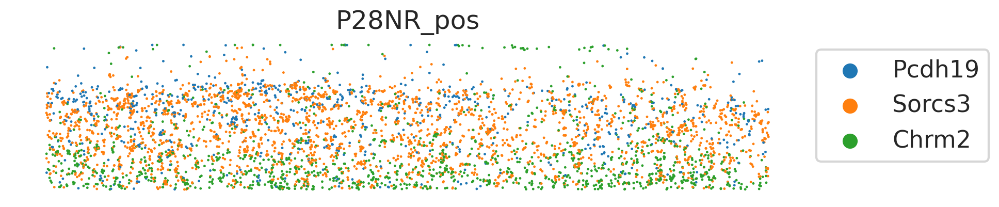

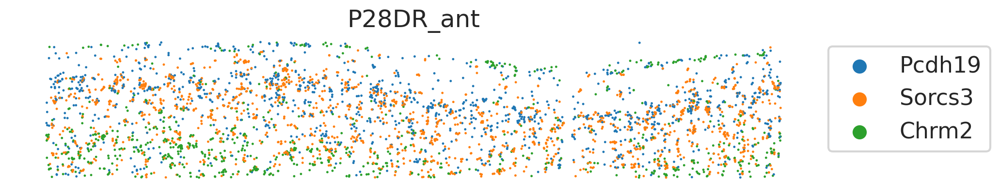

In [13]:
query_genes = ['Pcdh19', 'Sorcs3', 'Chrm2']
for name in ['P28NR_pos', 'P28DR_ant']: #, df in dfs.items():
    df = dfs[name]
    abc = df[df['gene'].isin(query_genes)]
    
    fig, ax = plt.subplots(1,1,figsize=(15,2))
    sns.scatterplot(data=abc.sample(frac=1, replace=False), 
                    x='width', y='depth', hue='gene', hue_order=query_genes, 
                    s=3, edgecolor='none', ax=ax, )
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title(name)
    ax.legend(bbox_to_anchor=(1,1))
    ax.invert_yaxis()
    plt.show()

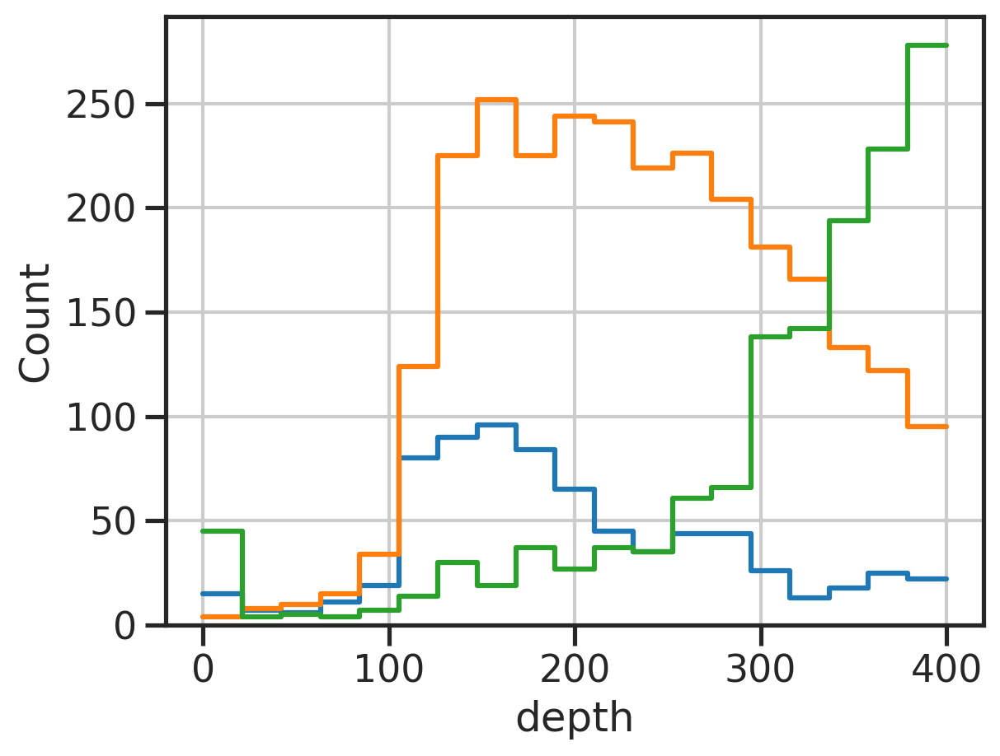

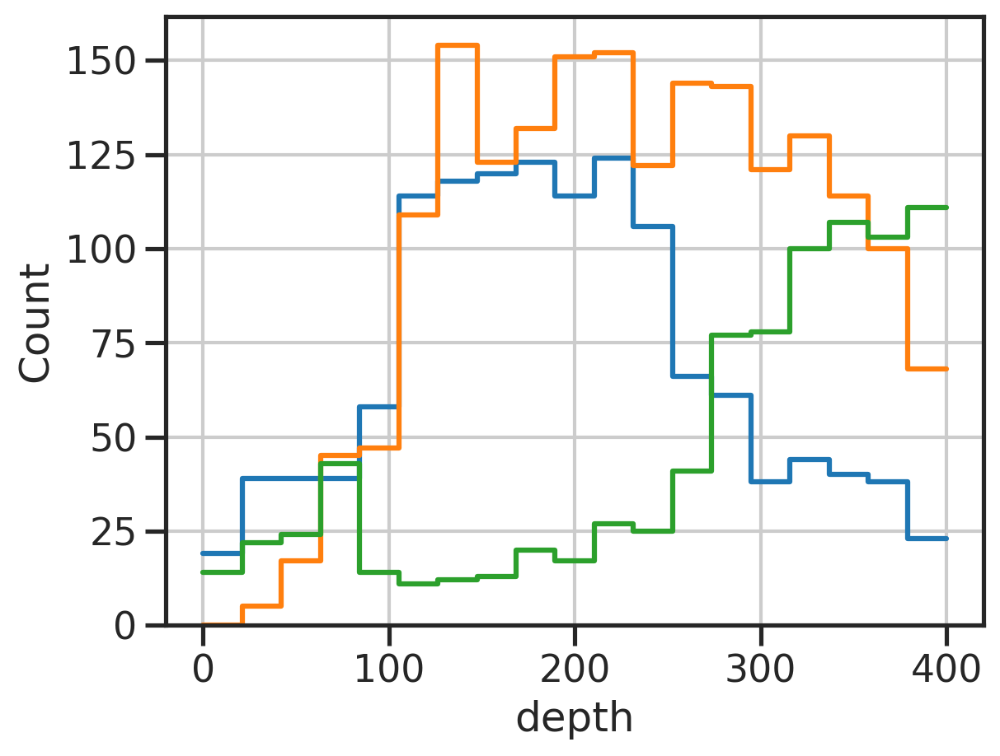

In [14]:
bins = np.linspace(0,400,20)
query_genes = ['Pcdh19', 'Sorcs3', 'Chrm2']
df = dfs['P28NR_pos']
for gn in query_genes:
    sns.histplot(df.loc[df['gene'].isin([gn]), 'depth'], bins=bins, element='step', fill=False) # .sample(frac=1, replace=False), 
plt.show()
            
df = dfs['P28DR_ant']
for gn in query_genes:
    sns.histplot(df.loc[df['gene'].isin([gn]), 'depth'], bins=bins, element='step', fill=False) # .sample(frac=1, replace=False), 
plt.show()


                    # x='width', y='depth', hue='gene', hue_order=query_genes, 
                    # s=4, edgecolor='none', ax=ax, )

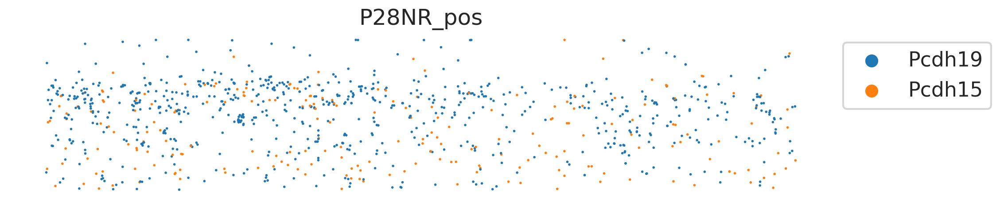

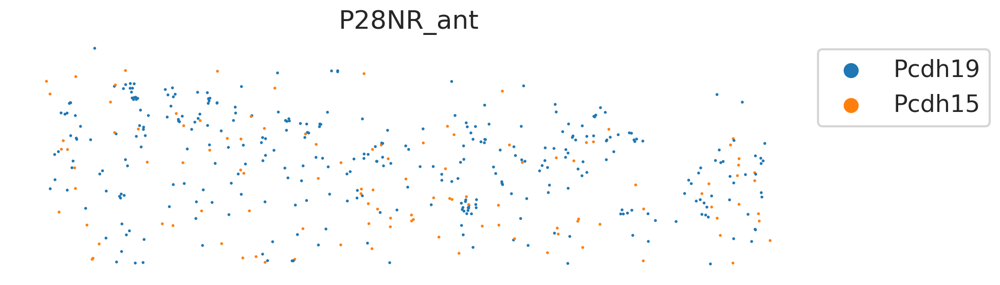

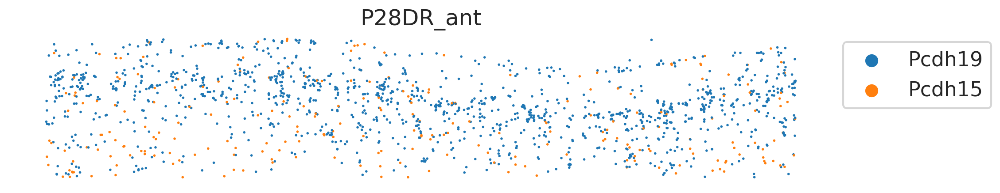

In [16]:
# query_genes = ['Cdh13', 'Pcdh19', 'Rfx3', ]
# query_genes = ['Sema6a', 'Gabrg3']
# query_genes = ['Cdh13', 'Sox5', 'Chrm2', ]
query_genes = ['Pcdh19', 'Pcdh15']
for name, df in dfs.items():
    abc = df[df['gene'].isin(query_genes)]
    
    fig, ax = plt.subplots(1,1,figsize=(12,3))
    sns.scatterplot(data=abc.sample(frac=1, replace=False), 
                    x='width', y='depth', hue='gene', hue_order=query_genes, 
                    s=4, edgecolor='none', ax=ax, )
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title(name)
    ax.legend(bbox_to_anchor=(1,1))
    ax.invert_yaxis()

# histogram analysis

In [16]:
sns.color_palette('tab20c')

[(0.19215686274509805, 0.5098039215686274, 0.7411764705882353),
 (0.4196078431372549, 0.6823529411764706, 0.8392156862745098),
 (0.6196078431372549, 0.792156862745098, 0.8823529411764706),
 (0.7764705882352941, 0.8588235294117647, 0.9372549019607843),
 (0.9019607843137255, 0.3333333333333333, 0.050980392156862744),
 (0.9921568627450981, 0.5529411764705883, 0.23529411764705882),
 (0.9921568627450981, 0.6823529411764706, 0.4196078431372549),
 (0.9921568627450981, 0.8156862745098039, 0.6352941176470588),
 (0.19215686274509805, 0.6392156862745098, 0.32941176470588235),
 (0.4549019607843137, 0.7686274509803922, 0.4627450980392157),
 (0.6313725490196078, 0.8509803921568627, 0.6078431372549019),
 (0.7803921568627451, 0.9137254901960784, 0.7529411764705882),
 (0.4588235294117647, 0.4196078431372549, 0.6941176470588235),
 (0.6196078431372549, 0.6039215686274509, 0.7843137254901961),
 (0.7372549019607844, 0.7411764705882353, 0.8627450980392157),
 (0.8549019607843137, 0.8549019607843137, 0.9215686274509803),
 (0.38823529411764707, 0.38823529411764707, 0.38823529411764707),
 (0.5882352941176471, 0.5882352941176471, 0.5882352941176471),
 (0.7411764705882353, 0.7411764705882353, 0.7411764705882353),
 (0.8509803921568627, 0.8509803921568627, 0.8509803921568627)]

In [17]:
linestyles = {
    'P28NR_ant': '-',
    'P28NR_pos': '-',
    'P28DR_ant': '--',
}

colors = {
    'P28NR_pos': sns.color_palette('tab20c')[5],
    'P28NR_ant': sns.color_palette('tab20c')[6],
    
    'P28DR_ant': 'k',
}

bins = np.linspace(0,400,20)
midpoints = np.mean([bins[:-1], bins[1:]], axis=0)

In [18]:
# size normed counts by depth
df_dbins = {}
for name in names:
    df = dfs[name]
    df['depth_bin'] = pd.cut(df['depth'].values, bins=bins)
    df_dbin = df.groupby(['depth_bin', 'gene']).size().unstack()
    df_dbins[name] = df_dbin/area_factors[name]

In [19]:
# ref point for each gene - mean normed counts across all L2/3 in NR
gene_mean_refs = pd.concat([
    df_dbins['P28NR_pos'].mean(), 
    df_dbins['P28NR_ant'].mean()], 
    axis=1).mean(axis=1)
gene_mean_refs

gene
6530403H02Rik      9.061404
Abcg1            168.596491
Adamts17          17.578947
Adamts2           42.271930
Adipor2           46.842105
                    ...    
Zfp618            23.166667
Zfp804a           39.122807
Zfp804b           11.631579
Zfpm2             39.973684
Zmat4             49.131579
Length: 550, dtype: float64

In [20]:
# gene expression as the fold change relative to the reference point
df_dbin_fcs = {}
for name in names:
    df_dbin = df_dbins[name]
    df_dbin_fc = df_dbin/gene_mean_refs
    df_dbin_fcs[name] = df_dbin_fc

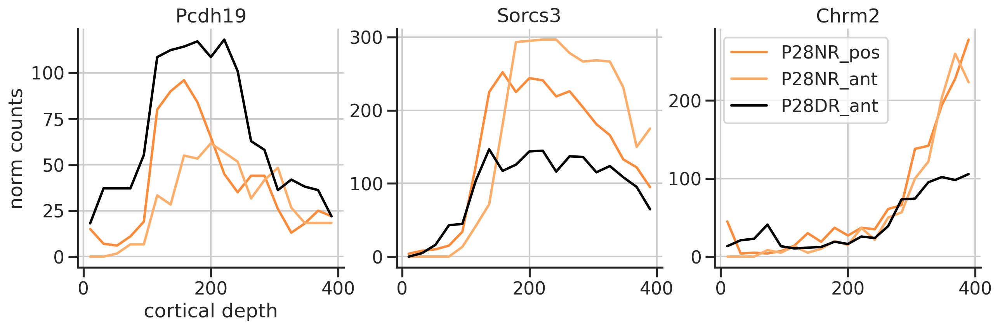

In [21]:
# query_genes = ['Cdh13', 'Sorcs3', 'Chrm2']
query_genes = ['Pcdh19', 'Sorcs3', 'Chrm2']
fig, axs = plt.subplots(1, 3, figsize=(3*5,1*4), sharex=True, sharey=False)
ax = axs[0]
ax.set_ylabel('norm counts')
ax.set_xlabel('cortical depth')

for j, gene in enumerate(query_genes):
    ax = axs[j]
    ax.set_title(gene)
    for i, name in enumerate(names):
        color = colors[name]
        hist_norm  = df_dbins[name][gene]
        ax.plot(midpoints, hist_norm, 
                color=color, label=name)
        sns.despine(ax=ax)

ax.legend()
plt.show()

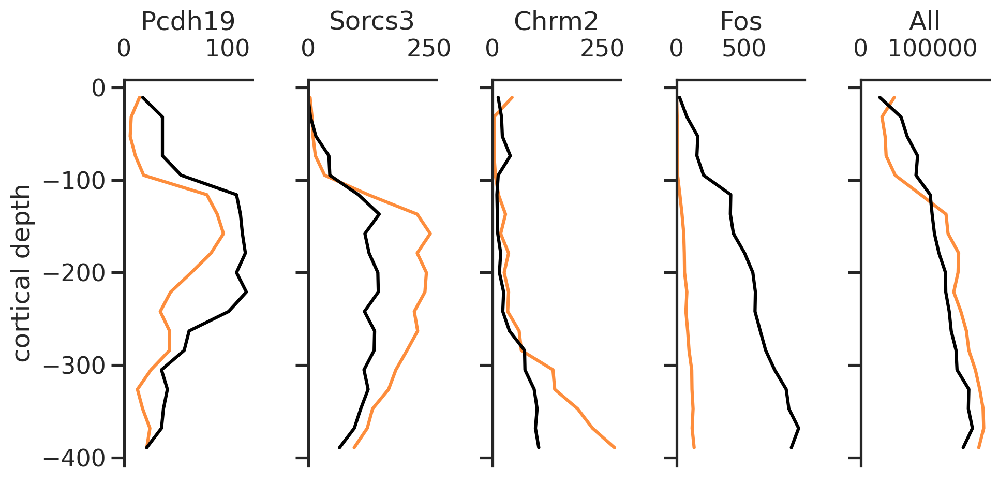

In [22]:
query_genes = ['Pcdh19', 'Sorcs3', 'Chrm2', 'Fos', 'All']
samples = ['P28NR_pos', 'P28DR_ant']
fig, axs = plt.subplots(1, 5, figsize=(5*2,1*5), sharex=False, sharey=True)
ax = axs[0]
# ax.set_xlabel('norm counts')
ax.set_ylabel('cortical depth')

for j, gene in enumerate(query_genes):
    ax = axs[j]
    ax.set_title(gene)
    for i, name in enumerate(samples):
        color = colors[name]
        if gene == 'All':
            hist_norm = df_dbins[name].sum(axis=1)
        else:
            hist_norm  = df_dbins[name][gene]
        ax.plot(hist_norm, -midpoints,  
                color=color, label=name)
        sns.despine(ax=ax, top=False, bottom=True)
    # ax.tick_params(axis='x', rotation=90, size=2)
    ax.set_xlim(xmin=0)
    ax.grid(False)

# ax.set_ylim([400,100])
# ax.legend()
fig.tight_layout()
plt.show()

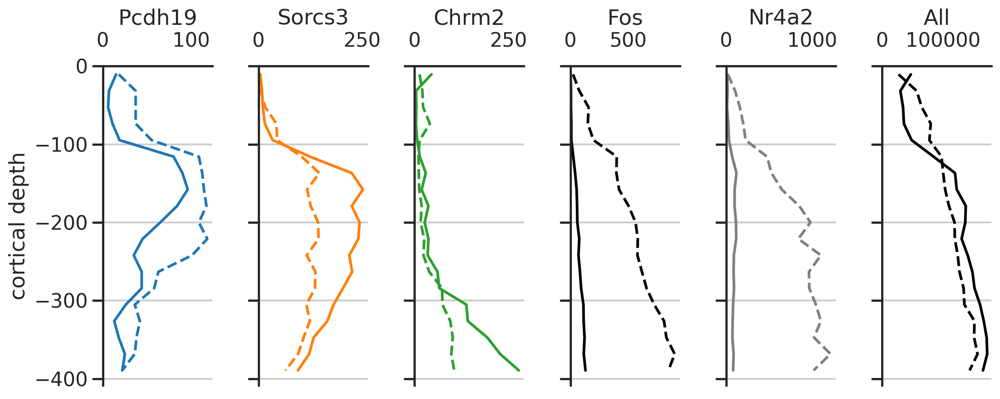

In [24]:
query_genes = ['Pcdh19', 'Sorcs3', 'Chrm2', 'Fos', 'Nr4a2', 'All']
samples = ['P28NR_pos', 'P28DR_ant']
colors = ['C0', 'C1', 'C2', 'k', 'gray', 'k']
linestyles = ['-', '--']
n = len(query_genes)
fig, axs = plt.subplots(1, n, figsize=(n*2,1*5), sharex=False, sharey=True)
ax = axs[0]
# ax.set_xlabel('norm counts')
ax.set_ylabel('cortical depth')

for j, gene in enumerate(query_genes):
    ax = axs[j]
    ax.set_title(gene)
    color = colors[j]
    for i, (name, linestyle) in enumerate(zip(samples, linestyles)):
        # color = colors[name]
        if gene == 'All':
            hist_norm = df_dbins[name].sum(axis=1)
        else:
            hist_norm  = df_dbins[name][gene]
        ax.plot(hist_norm, -midpoints,  
                color=color, label=name, linestyle=linestyle)
        sns.despine(ax=ax, top=False, bottom=True)
    # ax.tick_params(axis='x', rotation=90, size=2)
    ax.set_xlim(xmin=0)
    ax.set_ylim(ymax=0)
    ax.grid(visible=False, axis='x')

# ax.set_ylim([400,100])
# ax.legend()
fig.tight_layout()
plt.show()

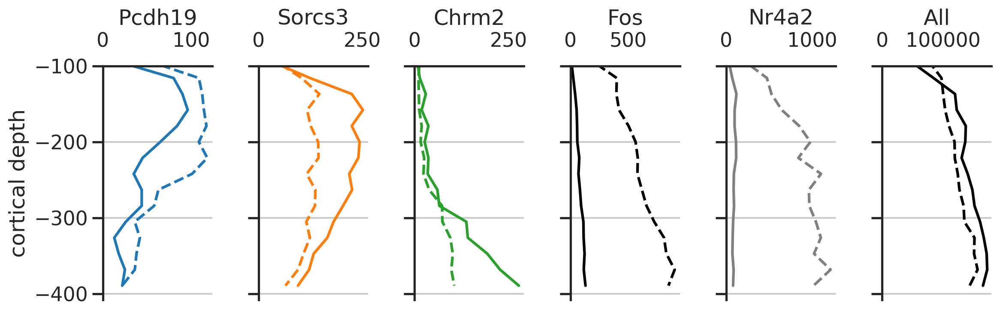

In [26]:

query_genes = ['Pcdh19', 'Sorcs3', 'Chrm2', 'Fos', 'Nr4a2', 'All']
samples = ['P28NR_pos', 'P28DR_ant']
colors = ['C0', 'C1', 'C2', 'k', 'gray', 'k']
linestyles = ['-', '--']
n = len(query_genes)
fig, axs = plt.subplots(1, n, figsize=(n*2,1*4), sharex=False, sharey=True)
ax = axs[0]
# ax.set_xlabel('norm counts')
ax.set_ylabel('cortical depth')

for j, gene in enumerate(query_genes):
    ax = axs[j]
    ax.set_title(gene)
    color = colors[j]
    for i, (name, linestyle) in enumerate(zip(samples, linestyles)):
        # color = colors[name]
        if gene == 'All':
            hist_norm = df_dbins[name].sum(axis=1)
        else:
            hist_norm  = df_dbins[name][gene]
        ax.plot(hist_norm, -midpoints,  
                color=color, label=name, linestyle=linestyle)
        sns.despine(ax=ax, top=False, bottom=True)
    # ax.tick_params(axis='x', rotation=90, size=2)
    ax.set_xlim(xmin=0)
    ax.set_ylim(ymax=-100)
    ax.grid(visible=False, axis='x')

# ax.set_ylim([400,100])
# ax.legend()
fig.tight_layout()
plt.show()

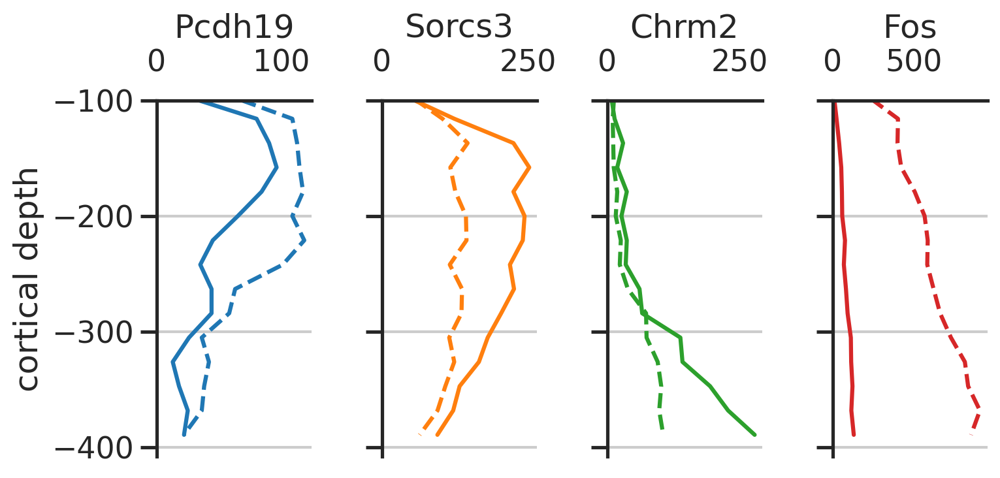

In [23]:
query_genes = ['Pcdh19', 'Sorcs3', 'Chrm2', 'Fos',] # 'All']
samples = ['P28NR_pos', 'P28DR_ant']
linestyles = ['-', '--']
fig, axs = plt.subplots(1, 4, figsize=(4*2,1*4), sharex=False, sharey=True)
ax = axs[0]
# ax.set_xlabel('norm counts')
ax.set_ylabel('cortical depth')

for j, gene in enumerate(query_genes):
    ax = axs[j]
    ax.set_title(gene)
    color = f'C{j}'
    for i, (name, linestyle) in enumerate(zip(samples, linestyles)):
        # color = colors[name]
        if gene == 'All':
            hist_norm = df_dbins[name].sum(axis=1)
        else:
            hist_norm  = df_dbins[name][gene]
        ax.plot(hist_norm, -midpoints,  
                color=color, label=name, linestyle=linestyle)
        sns.despine(ax=ax, top=False, bottom=True)
    # ax.tick_params(axis='x', rotation=90, size=2)
    ax.set_xlim(xmin=0)
    ax.set_ylim(ymax=-100)
    ax.grid(visible=False, axis='x')

# ax.set_ylim([400,100])
# ax.legend()
fig.tight_layout()
plt.show()

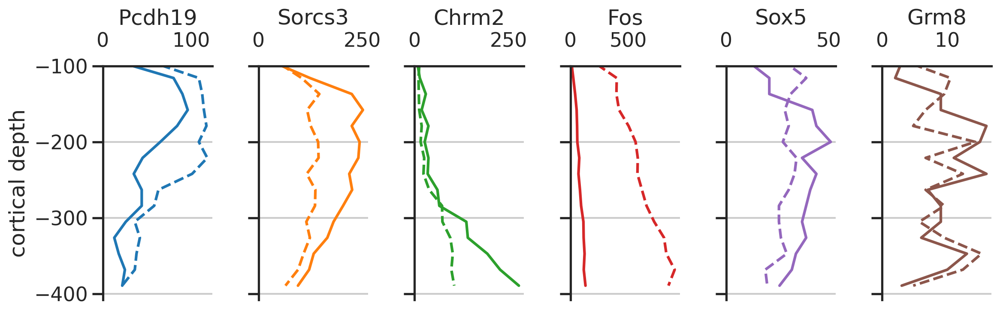

In [27]:
query_genes = ['Pcdh19', 'Sorcs3', 'Chrm2', 'Fos', 'Sox5', 'Grm8'] # 'All']
samples = ['P28NR_pos', 'P28DR_ant']
linestyles = ['-', '--']
fig, axs = plt.subplots(1, 6, figsize=(6*2,1*4), sharex=False, sharey=True)
ax = axs[0]
# ax.set_xlabel('norm counts')
ax.set_ylabel('cortical depth')

for j, gene in enumerate(query_genes):
    ax = axs[j]
    ax.set_title(gene)
    color = f'C{j}'
    for i, (name, linestyle) in enumerate(zip(samples, linestyles)):
        # color = colors[name]
        if gene == 'All':
            hist_norm = df_dbins[name].sum(axis=1)
        else:
            hist_norm  = df_dbins[name][gene]
        ax.plot(hist_norm, -midpoints,  
                color=color, label=name, linestyle=linestyle)
        sns.despine(ax=ax, top=False, bottom=True)
    # ax.tick_params(axis='x', rotation=90, size=2)
    ax.set_xlim(xmin=0)
    ax.set_ylim(ymax=-100)
    ax.grid(visible=False, axis='x')

# ax.set_ylim([400,100])
# ax.legend()
fig.tight_layout()
plt.show()

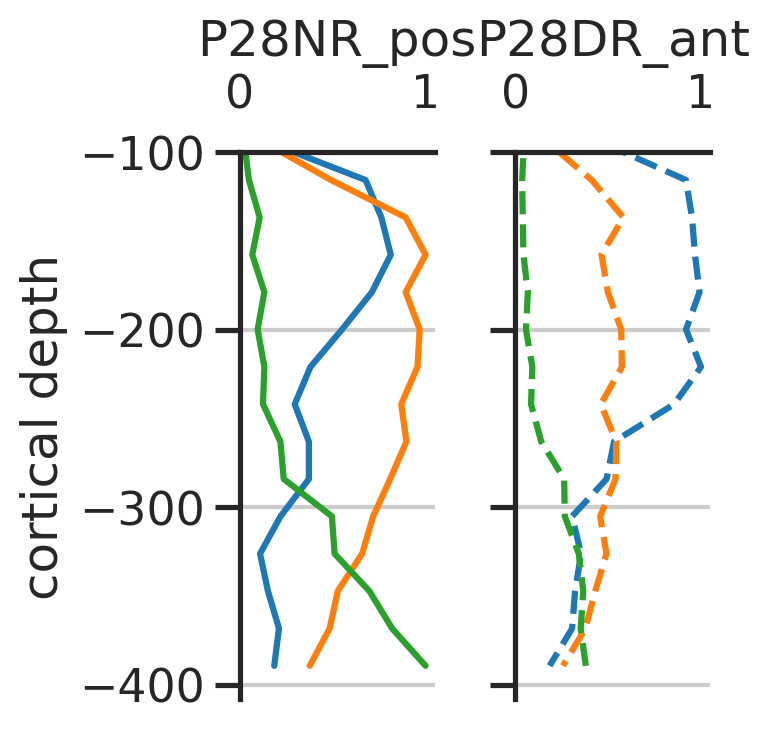

In [25]:
query_genes = ['Pcdh19', 'Sorcs3', 'Chrm2',] # 'Fos', 'All']
samples = ['P28NR_pos', 'P28DR_ant']
linestyles = ['-', '--']
fig, axs = plt.subplots(1, 2, figsize=(2*2,1*4), sharex=False, sharey=True)
ax = axs[0]
# ax.set_xlabel('norm counts')
ax.set_ylabel('cortical depth')


query_gene_max = []
for gene in query_genes:
    genemax = np.max([df_dbins[name][gene] for name in samples])
    query_gene_max.append(genemax)

for i, (name, linestyle) in enumerate(zip(samples, linestyles)):
    ax = axs[i]
    ax.set_title(name)
    for j, (gene, genemax) in enumerate(zip(query_genes, query_gene_max)):
        color = f'C{j}'
        if gene == 'All':
            hist_norm = df_dbins[name].sum(axis=1)
        else:
            hist_norm = df_dbins[name][gene]/genemax
        ax.plot(hist_norm, -midpoints,  
                color=color, label=name, linestyle=linestyle)
        sns.despine(ax=ax, top=False, bottom=True)
    ax.set_xlim(xmin=0)
    ax.set_ylim(ymax=-100)
    ax.grid(visible=False, axis='x')

# ax.set_ylim([400,100])
# ax.legend()
fig.tight_layout()
plt.show()

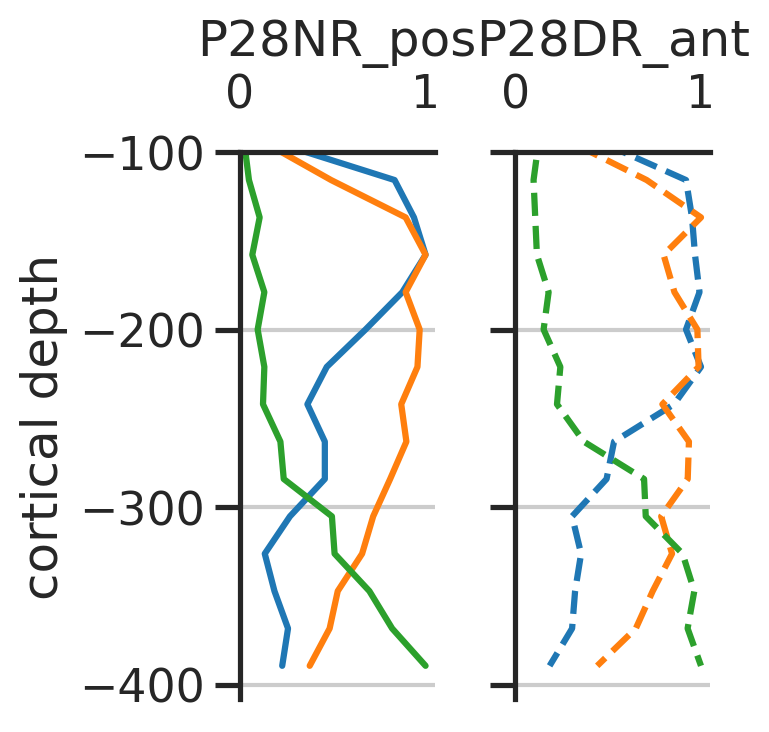

In [26]:
query_genes = ['Pcdh19', 'Sorcs3', 'Chrm2',] # 'Fos', 'All']
samples = ['P28NR_pos', 'P28DR_ant']
linestyles = ['-', '--']
fig, axs = plt.subplots(1, 2, figsize=(2*2,1*4), sharex=False, sharey=True)
ax = axs[0]
# ax.set_xlabel('norm counts')
ax.set_ylabel('cortical depth')

for i, (name, linestyle) in enumerate(zip(samples, linestyles)):
    ax = axs[i]
    ax.set_title(name)
    for j, (gene) in enumerate(query_genes):
        color = f'C{j}'
        if gene == 'All':
            hist_norm = df_dbins[name].sum(axis=1)
        else:
            hist_norm = df_dbins[name][gene]
            hist_norm = hist_norm/np.max(hist_norm)
        ax.plot(hist_norm, -midpoints,  
                color=color, label=name, linestyle=linestyle)
        sns.despine(ax=ax, top=False, bottom=True)
    ax.set_xlim(xmin=0)
    ax.set_ylim(ymax=-100)
    ax.grid(visible=False, axis='x')

# ax.set_ylim([400,100])
# ax.legend()
fig.tight_layout()
plt.show()

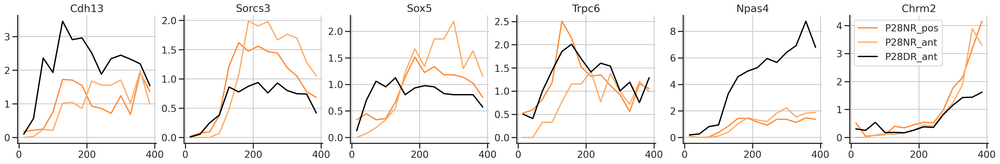

In [17]:
query_genes = ['Cdh13', 'Sorcs3', 'Sox5', 'Trpc6', 'Npas4', 'Chrm2']
n = len(query_genes)

fig, axs = plt.subplots(1, n, figsize=(n*5,1*4), sharex=True, sharey=False)
for j, gene in enumerate(query_genes):
    ax = axs[j]
    ax.set_title(gene)
    for i, name in enumerate(names):
        color = colors[name]
        hist_norm_fc  = df_dbin_fcs[name][gene]
        ax.plot(midpoints, hist_norm_fc, 
                color=color, label=name)
        sns.despine(ax=ax)

ax.legend()
plt.show()

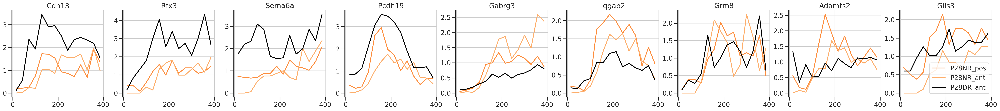

In [18]:
query_genes = ['Cdh13', 'Rfx3', 'Sema6a', 'Pcdh19', 'Gabrg3', 'Iqgap2', 'Grm8', 'Adamts2', 'Glis3']
n = len(query_genes)
fig, axs = plt.subplots(1, n, figsize=(n*5,1*4), sharex=True, sharey=False)
for j, gene in enumerate(query_genes):
    ax = axs[j]
    ax.set_title(gene)
    for i, name in enumerate(names):
        color = colors[name]
        hist_norm_fc  = df_dbin_fcs[name][gene]
        ax.plot(midpoints, hist_norm_fc, 
                color=color, label=name)
        sns.despine(ax=ax)

ax.legend()
plt.show()

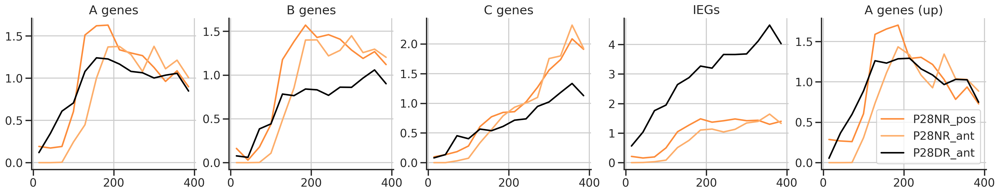

In [19]:
midpoints = np.mean([bins[:-1], bins[1:]], axis=0)
query_genesets = [agenes, bgenes, cgenes, iegs, up_agenes]# iegs]
titles = ['A genes', 'B genes', 'C genes', 'IEGs', 'A genes (up)']#, 'IEGs']
n = len(query_genesets)

fig, axs = plt.subplots(1, n, figsize=(n*5,1*4), sharex=True, sharey=False)
for j, geneset in enumerate(query_genesets):
    ax = axs[j]
    ax.set_title(titles[j])
    for i, (name) in enumerate(names):
        
        color = colors[name]
        hist_norm_fc  = (df_dbin_fcs[name][geneset]).apply(geometric_mean, axis=1) # mean(axis=1) # geometric mean
        ax.plot(midpoints, hist_norm_fc, 
                color=color, label=name)
        sns.despine(ax=ax)

ax.legend()


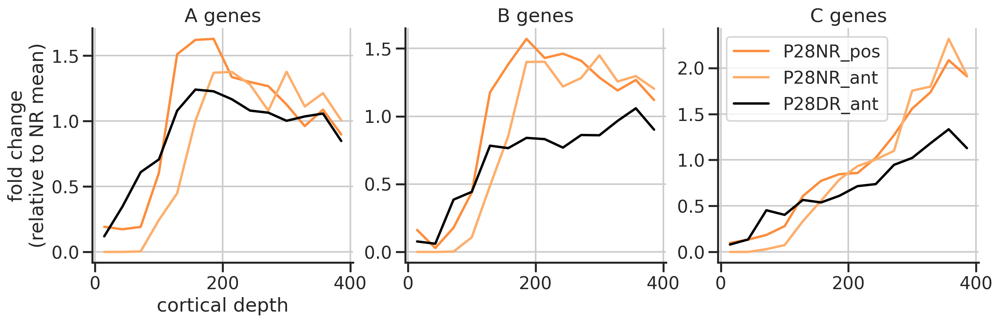

In [20]:
midpoints = np.mean([bins[:-1], bins[1:]], axis=0)
query_genesets = [agenes, bgenes, cgenes, ]# iegs]
titles = ['A genes', 'B genes', 'C genes', ]#, 'IEGs']
n = len(query_genesets)

fig, axs = plt.subplots(1, n, figsize=(n*5,1*4), sharex=True, sharey=False)
ax = axs[0]
ax.set_ylabel('fold change\n(relative to NR mean)')
ax.set_xlabel('cortical depth')
for j, geneset in enumerate(query_genesets):
    ax = axs[j]
    ax.set_title(titles[j])
    for i, (name) in enumerate(names):
        
        color = colors[name]
        hist_norm_fc  = (df_dbin_fcs[name][geneset]).apply(geometric_mean, axis=1) # mean(axis=1) # geometric mean
        ax.plot(midpoints, hist_norm_fc, 
                color=color, label=name)
        sns.despine(ax=ax)

ax.legend()

In [21]:
# try - Genes NR vs DR (MERFISH vs scRNA-seq)
# try - MERFISH cell typings on a triangle

# 20 EASI-FISH genes

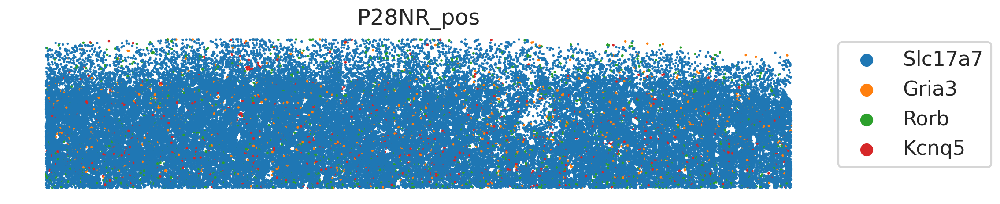

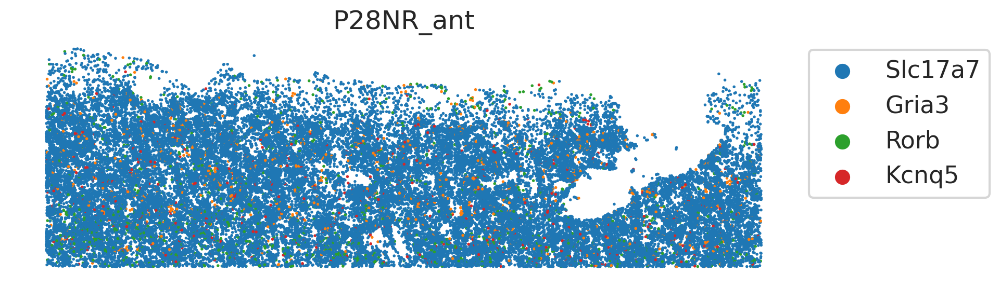

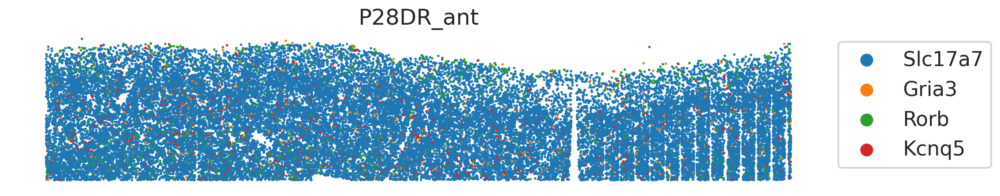

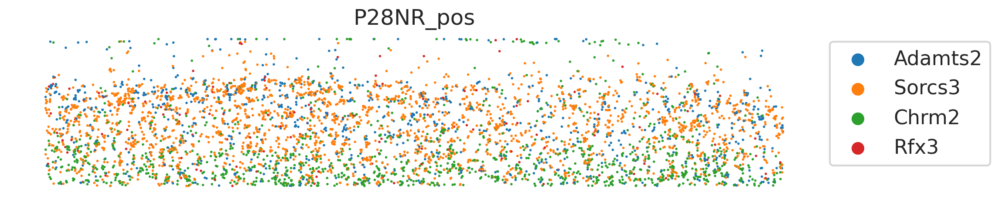

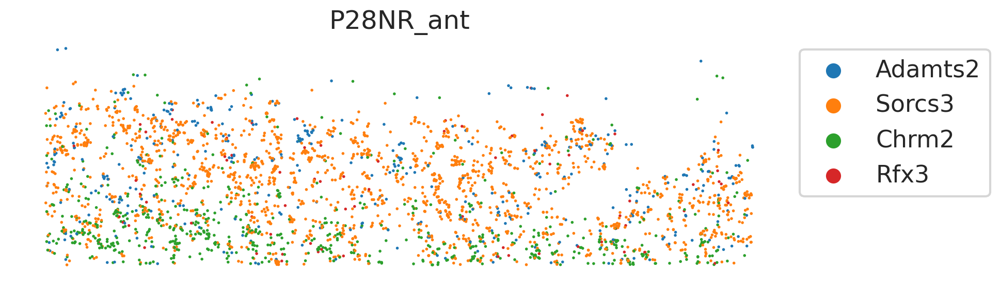

...

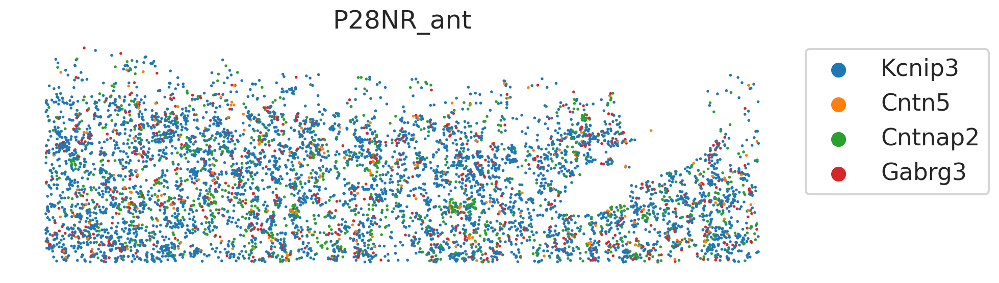

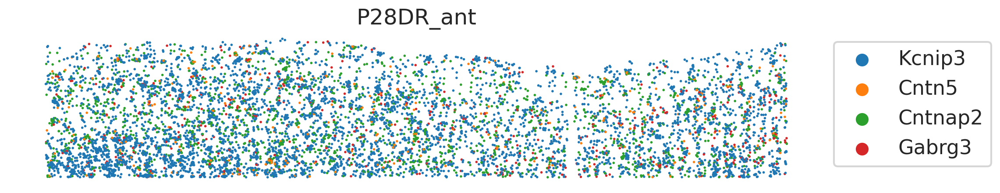

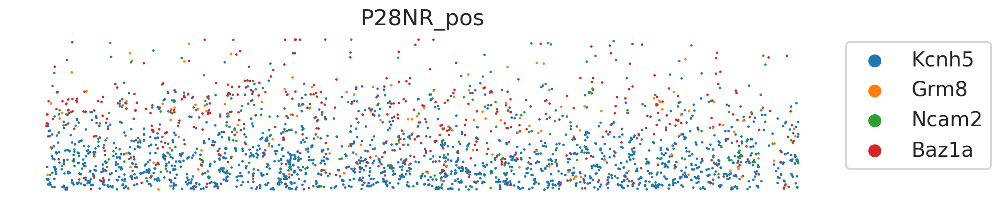

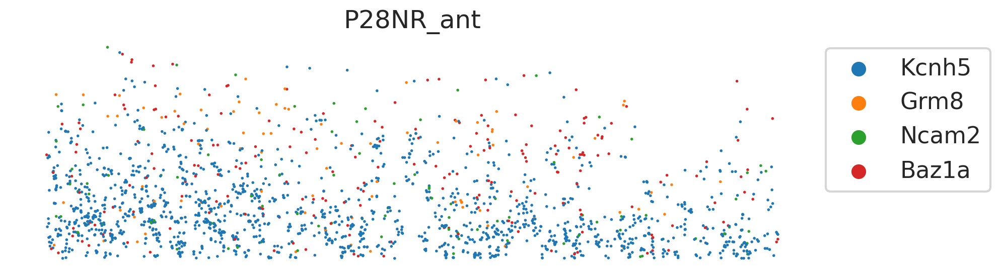

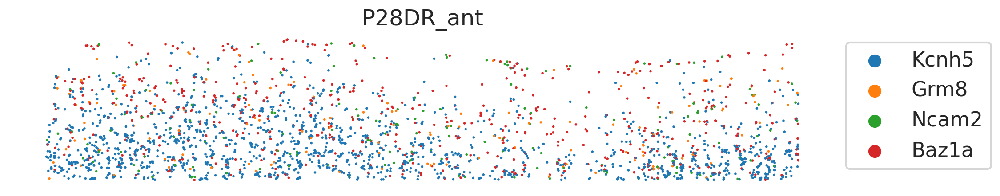

In [22]:
for i in range(5):
    query_genes = easifish_genes[i*4:(i+1)*4] 
    for name, df in dfs.items():
        abc = df[df['gene'].isin(query_genes)]

        fig, ax = plt.subplots(1,1,figsize=(12,3))
        sns.scatterplot(data=abc.sample(frac=1, replace=False), 
                        x='width', y='depth', hue='gene', hue_order=query_genes, 
                        s=4, edgecolor='none', ax=ax, )
        ax.set_aspect('equal')
        ax.axis('off')
        ax.set_title(name)
        ax.legend(bbox_to_anchor=(1,1))
        ax.invert_yaxis()

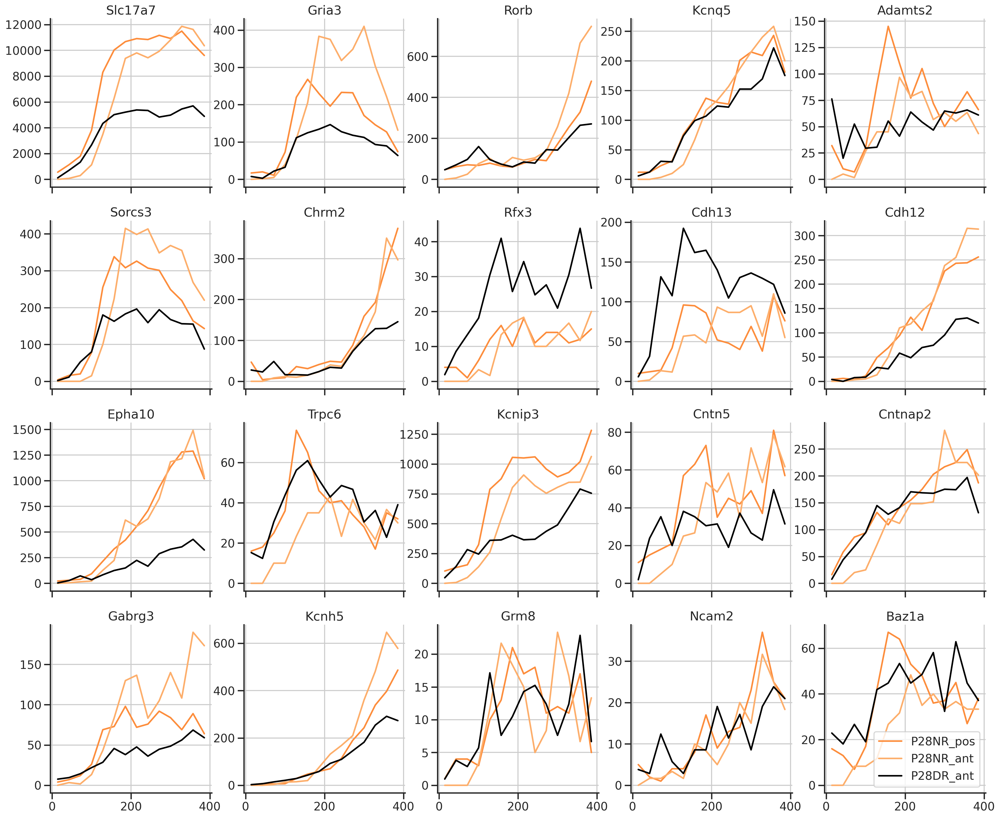

In [23]:
query_genes = easifish_genes # ['Cdh13', 'Rfx3', 'Sema6a', 'Pcdh19', 'Gabrg3', 'Iqgap2', 'Grm8', 'Adamts2', 'Glis3']
n = len(query_genes)
nx = 5
ny = int((n+nx-1)/nx)

fig, axs = plt.subplots(ny, nx, figsize=(ny*6,nx*4), sharex=True, sharey=False)
for j, gene in enumerate(query_genes):
    ax = axs.flat[j]
    ax.set_title(gene)
    for i, name in enumerate(names):
        color = colors[name]
        # hist_norm_fc  = df_dbin_fcs[name][gene]
        hist_norm = df_dbins[name][gene]
        ax.plot(midpoints, hist_norm, 
                color=color, label=name)
        sns.despine(ax=ax)

ax.legend()
plt.show()